# 예측 결과 출력
* predictionResult 변수에 Str 타입으로 예측결과를 입력해주세요.
* 그 이후 순서대로 실행하시면 됩니다.

순서
1. 이미지 로드(샘플)
2. 예측 결과에서 이미지 로드

In [1]:
import requests
import time
import urllib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import json
import elasticsearch5
import csv
import pickle

# 한글 출력준비

* 네이버 나눔고딕 폰트 등을 설치 또는 사용
* 폰트를 새로 설치 했다면 아래 실행
    ```
    import matplotlib as mpl
    mpl.font_manager._rebuild()
    ```

* 한글 폰트 사용하려면 관련 폰트를 등록하면 된다. (나의 경우는 나눔코딩 폰트)
    ```
    path = 'c:\\windows\\fonts\\nanumgothiccoding.ttf'
    font_name = fm.FontProperties(fname=path, size=50).get_name()
    plt.rc('font', family=font_name)
    ```


In [2]:
path = 'c:\\windows\\fonts\\nanumgothiccoding.ttf'
font_name = fm.FontProperties(fname=path, size=50).get_name()
plt.rc('font', family=font_name)

# 예측 결과 로딩

In [3]:
def load_pred_result(file_path):
    pred_dic = {}
    with open(file_path) as csvfile:
        reader = csv.reader(csvfile)        
        for row in reader:
            history = row[1].split('-')
            preds = list(map(lambda x: x.split('/'), row[2].split(':')))
            pred_dic[row[0]] = (history, preds)            
    return pred_dic

In [4]:
def load_item_b(file_path):
    item_b= []
    with open(file_path) as csvfile:
        reader = csv.reader(csvfile)        
        for row in reader:
            item_b.append(row)
    return item_b

# Elastic Search 를 이용

In [5]:
es = elasticsearch5.Elasticsearch('twiceSpark1:9200')

def es_search(es, deal_ids):
    res = es.search(index='ojm5', body={'query': {'ids':{'values':deal_ids}}}, size=100)
    n = res['hits']['total']
    dic = {}
    for hit in res['hits']['hits']:
        dic[hit['_id']] =  hit['_source']
    return dic
    

In [6]:
with open(r'c:\Users\wmp\TensorFlow\DeepInterestNetwork\base_model\deal_to_tn.pkl', 'rb') as base_file:
    deal_to_tn1 = pickle.load(base_file)

In [7]:
def show_preds(pred):
    img_base_url=r'http://img.wemep.co.kr/'
    history = es_search(es, pred[0])
        
    fig, axes = plt.subplots(ncols=len(pred[0]), figsize=(16,16))
    
    for i, h in enumerate(pred[0]):
        title = history[h]['_2']
        img = history[h]['_3']
        f = urllib.request.urlopen(img_base_url+img)
        a = plt.imread(f, format='jpg')
        axes[i].imshow(a)
        axes[i].set_title("{}".format(title))
        axes[i].axis('off')
    plt.show()
    
    candidates = list(map(lambda x: x[0], pred[1]))
    res = es_search(es, candidates)
    
    i = 0
    for prod, slot, prob in pred[1]:
        i+=1
        if prod in res:
            cat = res[prod]['_4']['_5']
            title = res[prod]['_2']
            img = res[prod]['_3']
            #print('{}[{}].{}.prod {}.slot {}.prob {}'.format(title, cat, img, prod, slot, prob))
            #continue
            
            f = urllib.request.urlopen(img_base_url+img)        
            # read the image file in a numpy array
            a = plt.imread(f, format='jpg')
            plt.imshow(a)
            plt.title("{}[{}] score:{} {} [{}]".format(i, slot, prob, title, cat))
            plt.axis('off')
            plt.show()

        else:
            print('no entry for product {}.slot {}.prob {}'.format(prod, slot, prob))

In [8]:
def show_item_b(item_b):
    img_base_url=r'http://img.wemep.co.kr/'
    
    candidates = list(map(lambda x: x[0], item_b))
    res = es_search(es, candidates)
    
    i = 0
    for deal, score in item_b:
        i+=1
        if deal in res:
            cat = res[deal]['_4']['_5']
            title = res[deal]['_2']
            img = res[deal]['_3']
            
            f = urllib.request.urlopen(img_base_url+img)        
            # read the image file in a numpy array
            a = plt.imread(f, format='jpg')
            plt.imshow(a)
            plt.title("{} score:{} {} [{}]".format(i, score, title, cat))
            plt.axis('off')
            plt.show()

        else:
            print('no entry for product {} score{}'.format(deal, score))

# base model

In [9]:
pred_base_model = load_pred_result(r'c:\Users\wmp\TensorFlow\DeepInterestNetwork\base_model\wepick_pred.csv')

In [10]:
item_b = load_item_b(r'c:\Users\wmp\TensorFlow\DeepInterestNetwork\base_model\item_b.csv')

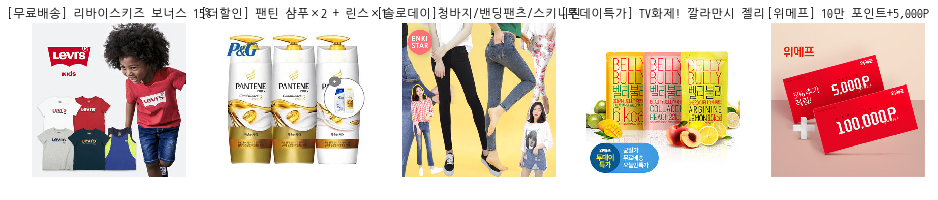

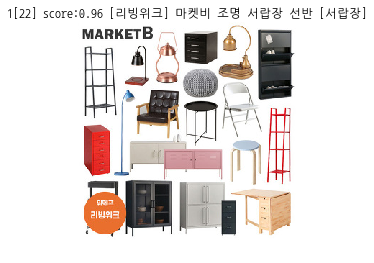

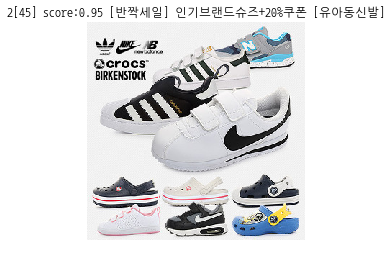

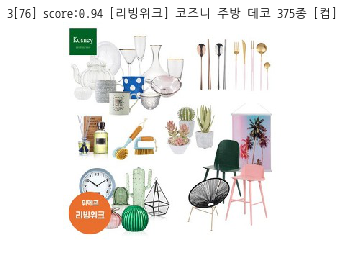

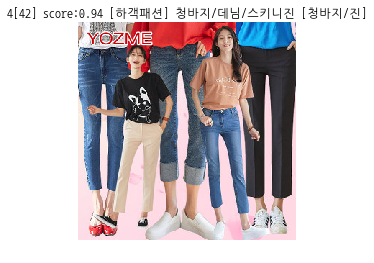

...

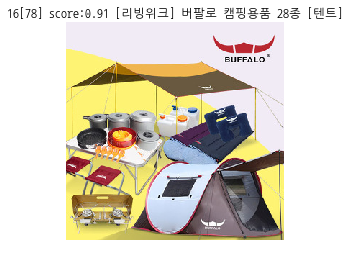

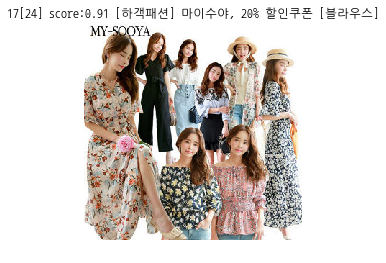

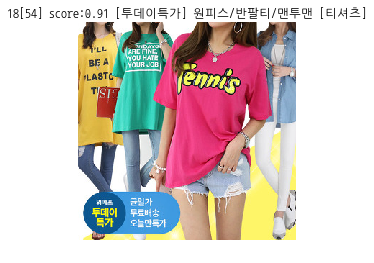

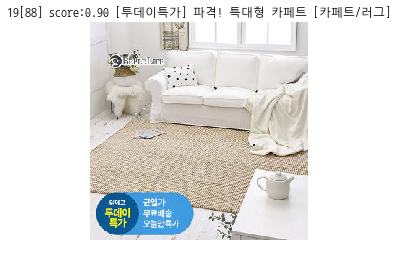

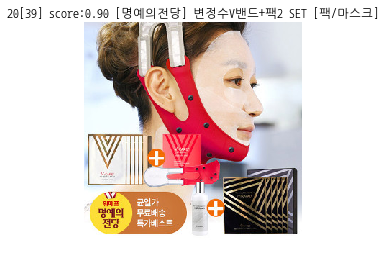

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [12]:
show_preds(pred_base_model['1000007'])

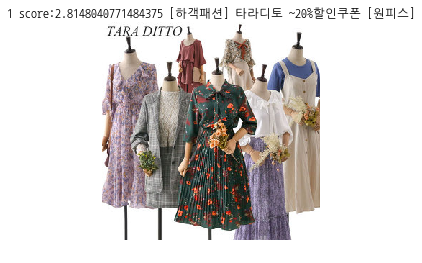

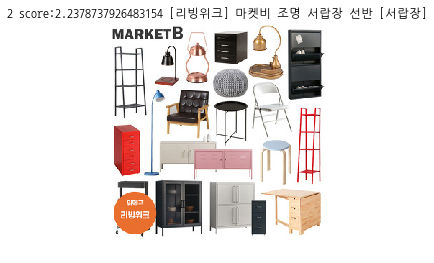

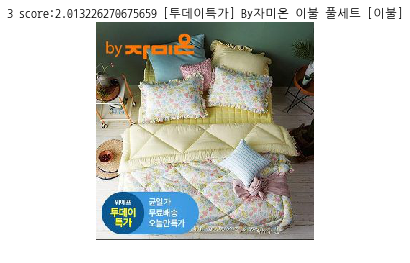

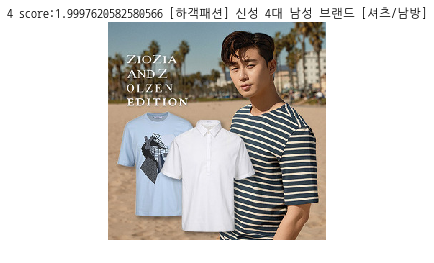

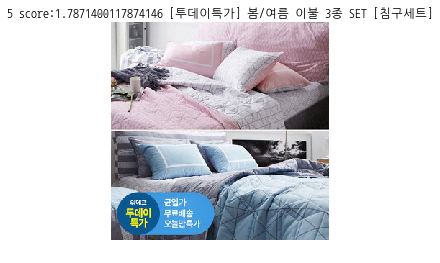

...

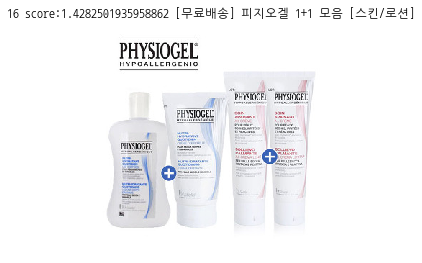

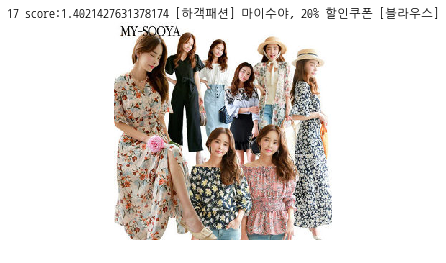

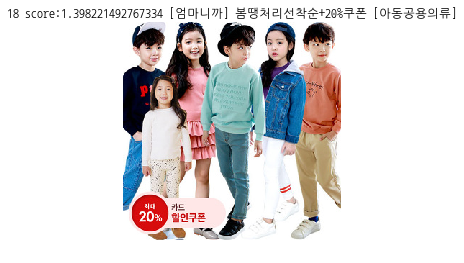

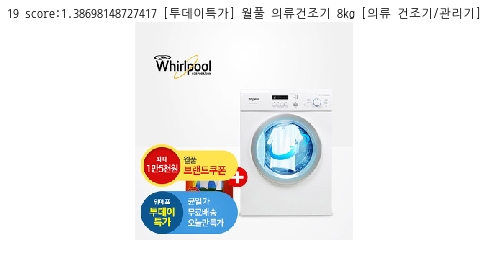

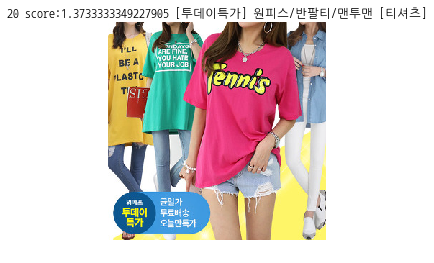

In [13]:
show_item_b(item_b[0:20])

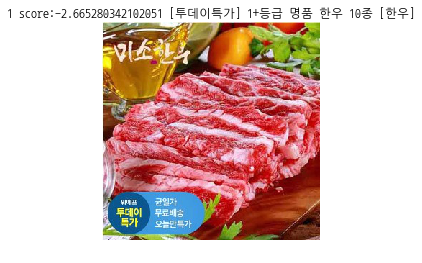

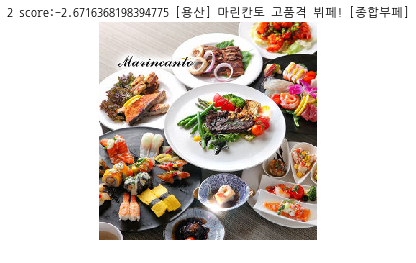

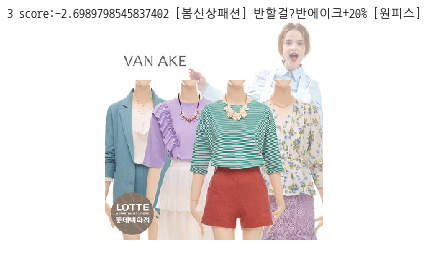

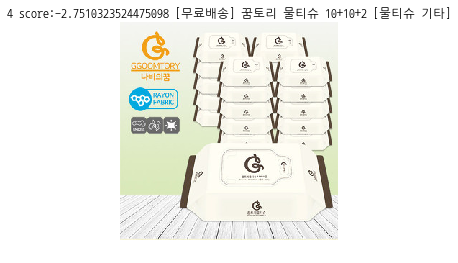

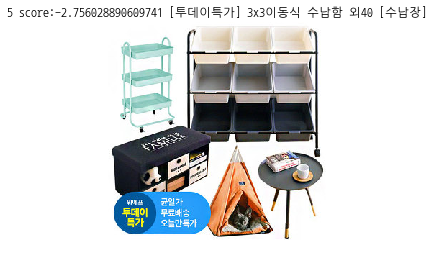

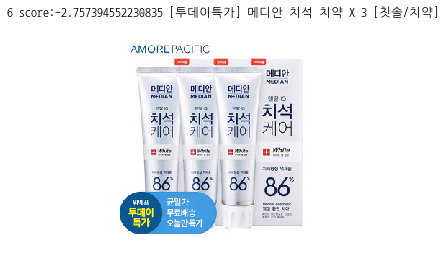

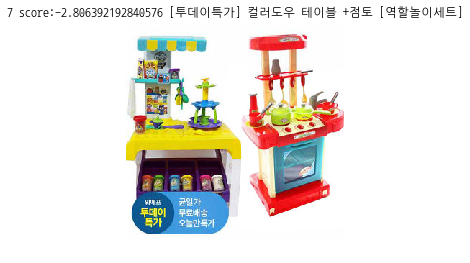

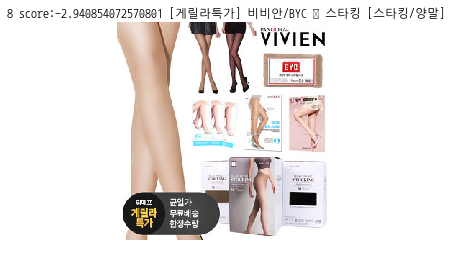

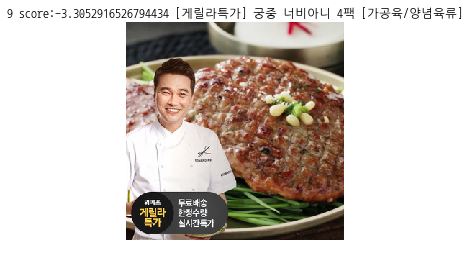

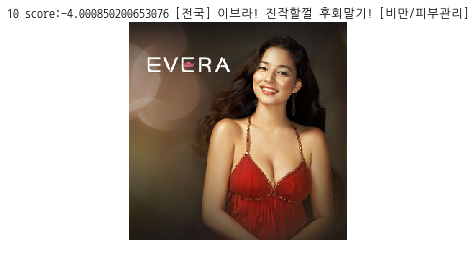

In [26]:
show_item_b(item_b[-10:], deal_to_tn1)

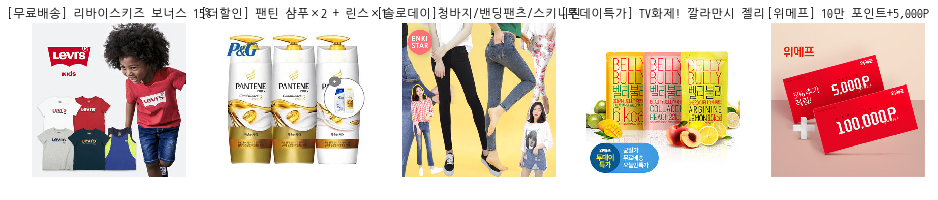

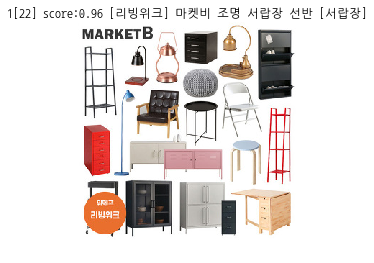

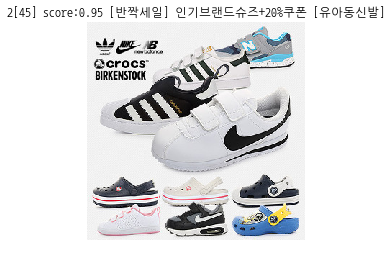

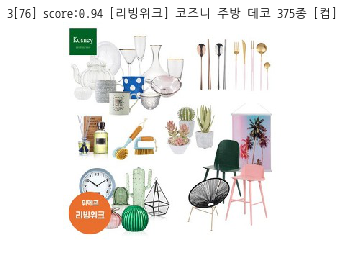

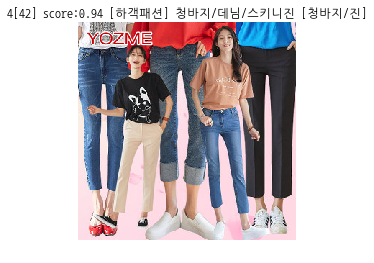

...

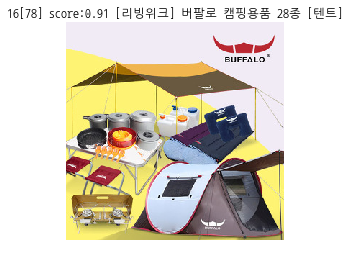

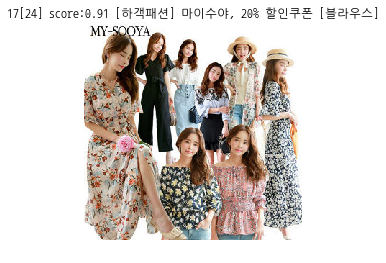

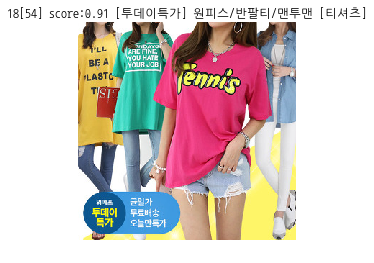

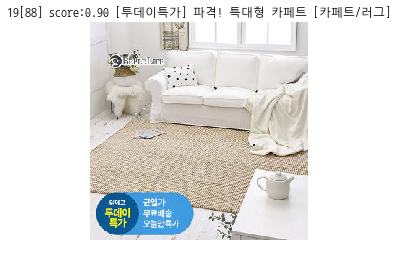

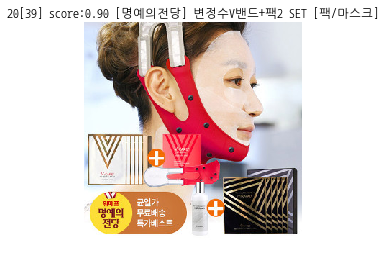

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [9]:
show_preds(pred_base_model['1000007'])

# din model

In [14]:
pred_din = load_pred_result(r'c:\Users\wmp\TensorFlow\DeepInterestNetwork\din\wepick_pred.csv')

In [16]:
item_b_din = load_item_b(r'c:\Users\wmp\TensorFlow\DeepInterestNetwork\din\item_b.csv')

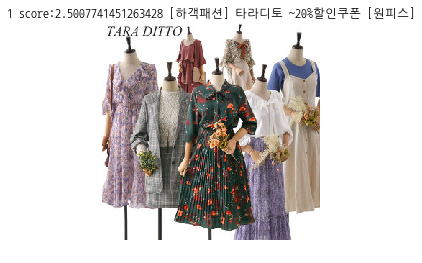

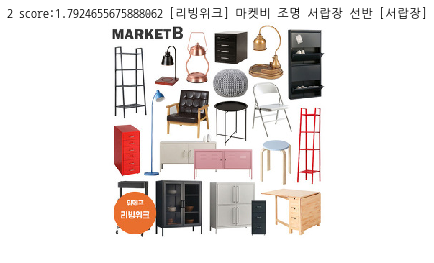

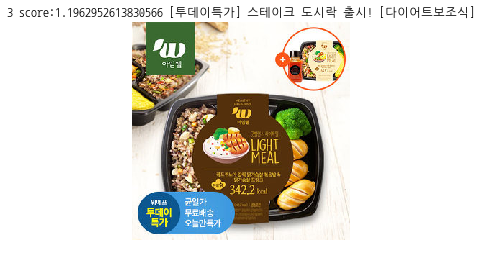

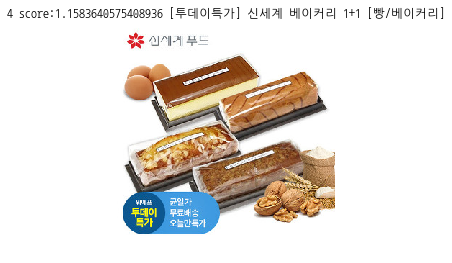

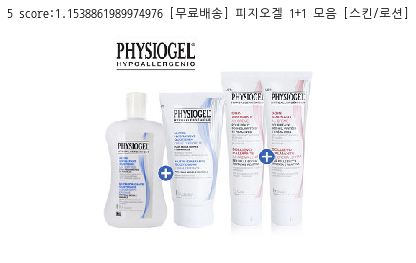

...

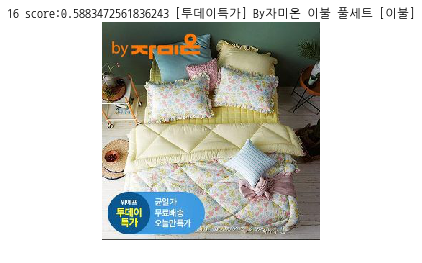

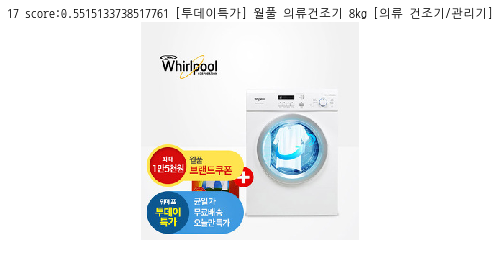

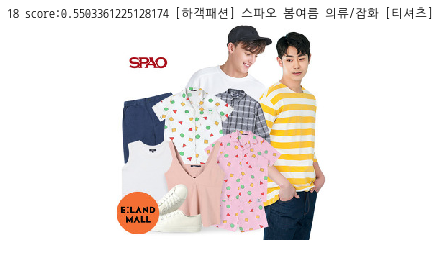

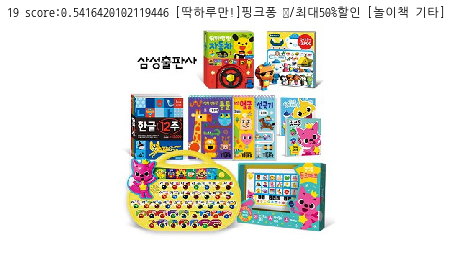

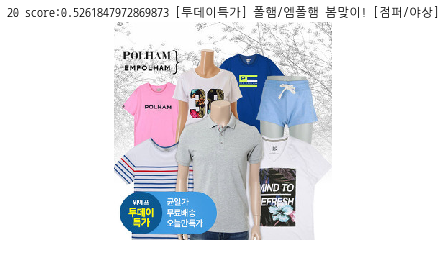

In [17]:
show_item_b(item_b_din[0:20])

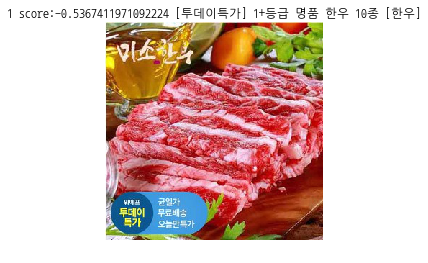

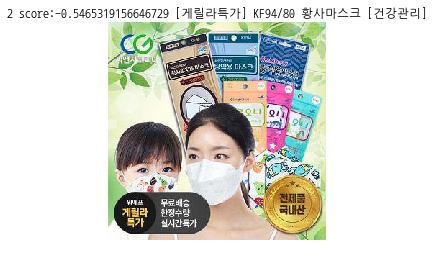

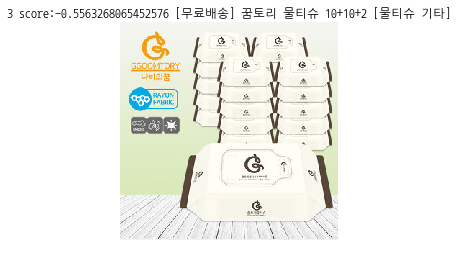

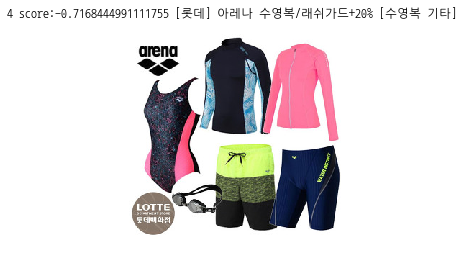

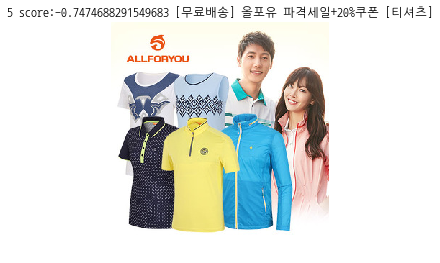

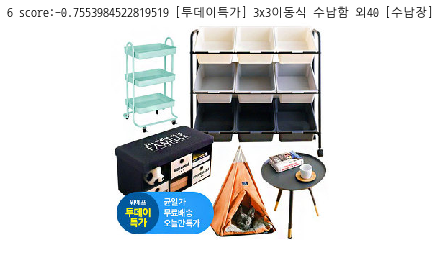

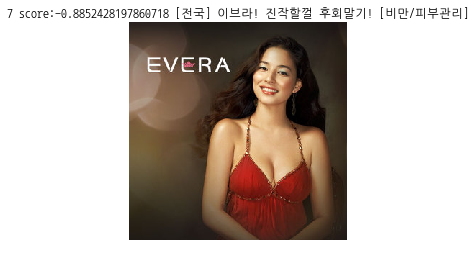

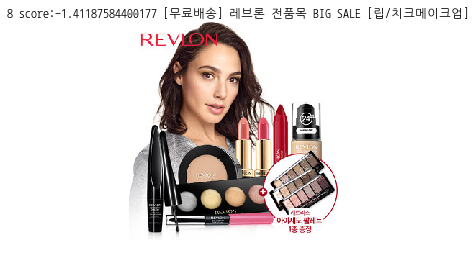

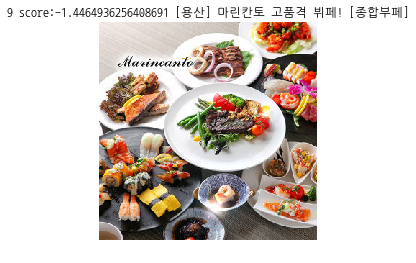

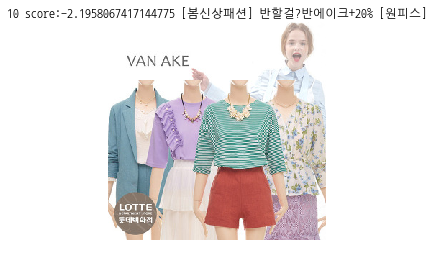

In [18]:
show_item_b(item_b_din[-10:])